## Using XGBOOST

### 4 weeks of data

In [23]:
import pandas as pd
from src.paths import TRANSFORMED_DATA_DIR

df = pd.read_parquet(TRANSFORMED_DATA_DIR / 'tabular_data.parquet')
df

,rides_previous_672_hour,rides_previous_671_hour,rides_previous_670_hour,rides_previous_669_hour,rides_previous_668_hour,rides_previous_667_hour,rides_previous_666_hour,rides_previous_665_hour,rides_previous_664_hour,rides_previous_663_hour,...,rides_previous_7_hour,rides_previous_6_hour,rides_previous_5_hour,rides_previous_4_hour,rides_previous_3_hour,rides_previous_2_hour,rides_previous_1_hour,pickup_hour,pickup_location_id,target_rides_next_hour
0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,2.0,0.0,0.0,...,2.0,0.0,1.0,0.0,0.0,0.0,0.0,2022-01-29,1,0.0
1,0.0,0.0,0.0,0.0,0.0,4.0,1.0,2.0,1.0,2.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2022-01-30,1,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,0.0,1.0,2.0,0.0,0.0,0.0,0.0,2022-01-31,1,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,2.0,1.0,0.0,1.0,1.0,0.0,0.0,2022-02-01,1,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-02-02,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89300,3.0,0.0,2.0,3.0,2.0,3.0,13.0,8.0,9.0,9.0,...,6.0,5.0,3.0,1.0,6.0,1.0,3.0,2022-12-27,265,3.0
89301,6.0,4.0,0.0,0.0,2.0,0.0,14.0,7.0,8.0,4.0,...,4.0,2.0,1.0,2.0,2.0,2.0,8.0,2022-12-28,265,1.0
89302,7.0,2.0,3.0,4.0,7.0,4.0,10.0,9.0,7.0,11.0,...,2.0,3.0,5.0,1.0,1.0,0.0,8.0,2022-12-29,265,3.0
89303,6.0,5.0,4.0,3.0,0.0,3.0,11.0,12.0,9.0,10.0,...,3.0,3.0,1.0,2.0,0.0,1.0,2.0,2022-12-30,265,7.0


In [24]:
from datetime import datetime
from src.data_split import train_test_split

X_train, y_train, X_test, y_test = train_test_split(
    df,
    cutoff_date=datetime(2022, 6, 1, 0, 0, 0),
    target_column_name='target_rides_next_hour'
)

print(f'{X_train.shape=}')
print(f'{y_train.shape=}')
print(f'{X_test.shape=}')
print(f'{y_test.shape=}')

X_train.shape=(32595, 674)
y_train.shape=(32595,)
X_test.shape=(56710, 674)
y_test.shape=(56710,)


In [3]:
import xgboost as xgb

In [25]:
# use only past rides data
past_rides_columns = [col for col in X_train.columns if col.startswith('rides_')]
X_train_only_numeric = X_train[past_rides_columns]

In [26]:
model = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)
model.fit(X_train_only_numeric, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=-1, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [27]:
X_test_only_numeric = X_test[past_rides_columns]
predictions = model.predict(X_test_only_numeric)
predictions

array([0.19497435, 0.12434751, 0.3150496 , ..., 4.752852  , 6.5632615 ,
       4.881758  ], dtype=float32)

In [28]:
from sklearn.metrics import mean_absolute_error
test_mae = mean_absolute_error(y_test, predictions)
print(f'{test_mae=}')

test_mae=2.576103


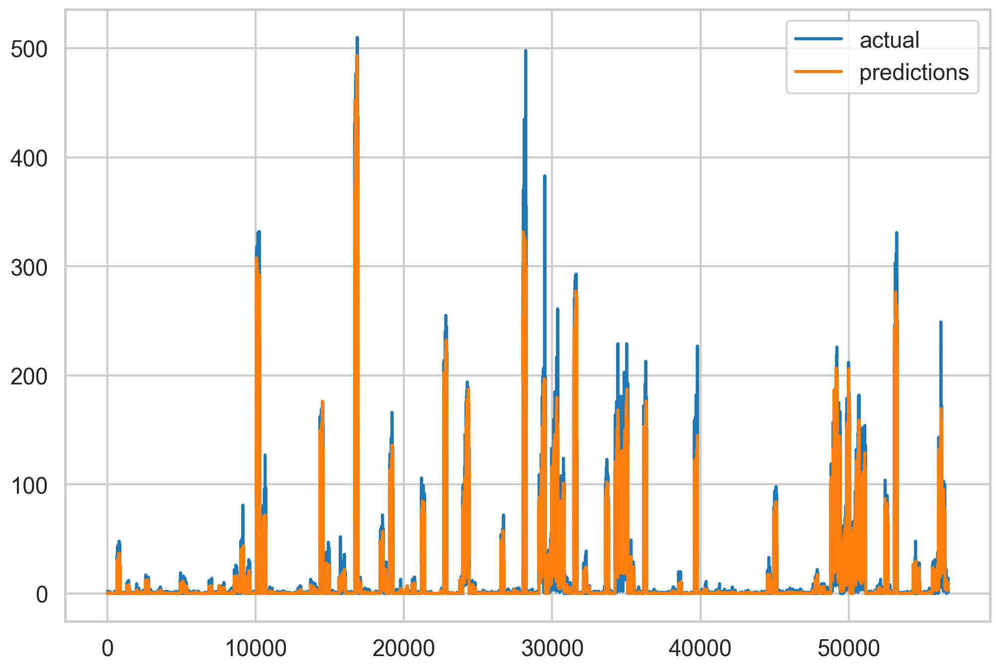

In [29]:
# visualize predictions
import matplotlib.pyplot as plt
import seaborn as sns
# retina display
%config InlineBackend.figure_format = 'retina'

sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure(figsize=(12, 8))
plt.plot(y_test, label='actual')
plt.plot(predictions, label='predictions')
plt.legend()
plt.show()

In [30]:
# visualize the predictions using plotly
import plotly.express as px
import plotly.graph_objects as go

# retina display
%config InlineBackend.figure_format = 'retina'

fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test.index, y=y_test, name='actual'))
fig.add_trace(go.Scatter(x=y_test.index, y=predictions, name='predicted'))
fig.update_layout(
    title='Baseline Model - Last 4 Weeks',
    xaxis_title='time',
    yaxis_title='rides'
)
fig.show()

### Feature Importance for 4 weeks of data

In [42]:
# feature importance
import numpy as np

feature_importance = pd.DataFrame(
    model.feature_importances_,
    index=X_train_only_numeric.columns,
    columns=['importance']
)
feature_importance.sort_values('importance', ascending=False, inplace=True)
feature_importance

,importance
rides_previous_336_hour,0.168160
rides_previous_504_hour,0.146645
rides_previous_168_hour,0.138697
rides_previous_1_hour,0.073729
rides_previous_332_hour,0.025460
...,...
rides_previous_236_hour,0.000000
rides_previous_121_hour,0.000000
rides_previous_472_hour,0.000000
rides_previous_227_hour,0.000000


Observation of feature importance for 4 weeks of data:
<br>From the code above, it seems that the most important features are for the last 14(336h) and 21(504h), and 7(168h) days of data.

In [43]:
# use only important features in the model and retrain
important_features = feature_importance[feature_importance['importance'] > 0.001].index # 0.01, 0.02
X_train_important = X_train[important_features]
X_test_important = X_test[important_features]

model_important = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)
model_important.fit(X_train_important, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=-1, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [44]:
important_features

Index(['rides_previous_336_hour', 'rides_previous_504_hour',
       'rides_previous_168_hour', 'rides_previous_1_hour',
       'rides_previous_332_hour', 'rides_previous_335_hour',
       'rides_previous_672_hour', 'rides_previous_167_hour',
       'rides_previous_612_hour', 'rides_previous_24_hour',
       ...
       'rides_previous_33_hour', 'rides_previous_79_hour',
       'rides_previous_103_hour', 'rides_previous_348_hour',
       'rides_previous_594_hour', 'rides_previous_437_hour',
       'rides_previous_215_hour', 'rides_previous_3_hour',
       'rides_previous_174_hour', 'rides_previous_198_hour'],
      dtype='object', length=119)

In [45]:
important_features.size, X_train_important.shape[1], X_test_important.shape[1]

(119, 119, 119)

In [46]:
# evaluate the model
predictions_important = model_important.predict(X_test_important)
test_mae_important = mean_absolute_error(y_test, predictions_important)
print(f'{test_mae_important=}')

test_mae_important=2.534324


In [ ]:
# # visualize the feature importance -> too many features to visualize
# import numpy as np

# feature_importance = model.feature_importances_
# feature_importance = 100.0 * (feature_importance / feature_importance.max())
# sorted_idx = np.argsort(feature_importance)
# pos = np.arange(sorted_idx.shape[0]) + .5

# plt.figure(figsize=(12, 8))
# plt.barh(pos, feature_importance[sorted_idx], align='center')
# plt.yticks(pos, X_train_only_numeric.columns[sorted_idx])
# plt.xlabel('Relative Importance')
# plt.title('Variable Importance')
# plt.show()


In [48]:
# visualize th results
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test.index, y=y_test, name='actual'))
fig.add_trace(go.Scatter(x=y_test.index, y=predictions, name='predicted'))
fig.add_trace(go.Scatter(x=y_test.index, y=predictions_important, name='predicted_important'))
fig.update_layout(
    title='Baseline Model - Last 4 Weeks',
    xaxis_title='time',
    yaxis_title='rides'
)
fig.show()


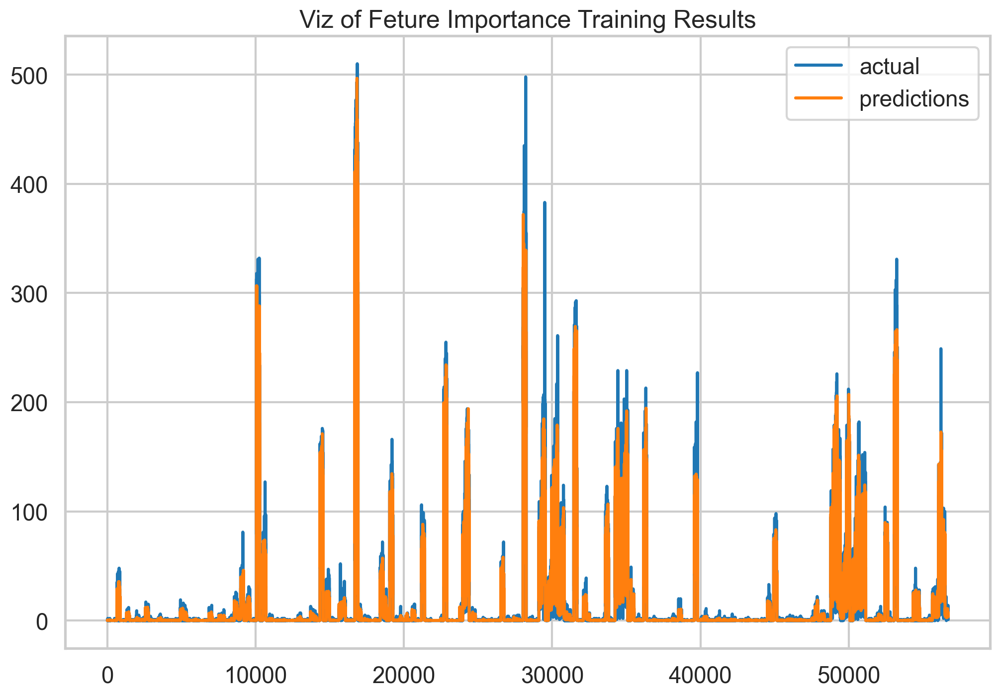

In [49]:
# visualize predictions
import matplotlib.pyplot as plt
import seaborn as sns
# retina display
%config InlineBackend.figure_format = 'retina'

sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure(figsize=(12, 8))
plt.plot(y_test, label='actual')
plt.plot(predictions_important, label='predictions')
plt.title('Viz of Feture Importance Training Results') 
plt.legend()
plt.show()

### Summary of feature importance for 4 weeks of data
I've reduced the number of feature to 119 from 674 (5.5 times lesser) and the results of MAE are promising: 
<br> `test_mae_important=2.534324` for feature importance and `test_mae=2.576103` for the original model.

### 8 weeks of data
To Do:
- [ ] Experiment with 8 weeks of data - use the same apporach as 4 weeks of data

In [11]:
import pandas as pd
from src.paths import TRANSFORMED_DATA_DIR

df = pd.read_parquet(TRANSFORMED_DATA_DIR / 'tabular_data_2_months.parquet')
df

,rides_previous_1344_hour,rides_previous_1343_hour,rides_previous_1342_hour,rides_previous_1341_hour,rides_previous_1340_hour,rides_previous_1339_hour,rides_previous_1338_hour,rides_previous_1337_hour,rides_previous_1336_hour,rides_previous_1335_hour,...,rides_previous_7_hour,rides_previous_6_hour,rides_previous_5_hour,rides_previous_4_hour,rides_previous_3_hour,rides_previous_2_hour,rides_previous_1_hour,pickup_hour,pickup_location_id,target_rides_next_hour
0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,2.0,0.0,0.0,...,1.0,2.0,0.0,0.0,0.0,0.0,0.0,2022-02-26,1,1.0
1,0.0,0.0,0.0,0.0,0.0,4.0,1.0,2.0,1.0,2.0,...,1.0,0.0,1.0,1.0,0.0,1.0,0.0,2022-02-27,1,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,3.0,2.0,0.0,2.0,0.0,0.0,0.0,2022-02-28,1,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-03-01,1,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,4.0,0.0,0.0,0.0,0.0,0.0,2022-03-02,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81880,4.0,6.0,0.0,1.0,1.0,7.0,22.0,18.0,25.0,17.0,...,6.0,5.0,3.0,1.0,6.0,1.0,3.0,2022-12-27,265,3.0
81881,2.0,6.0,4.0,2.0,4.0,10.0,16.0,17.0,20.0,12.0,...,4.0,2.0,1.0,2.0,2.0,2.0,8.0,2022-12-28,265,1.0
81882,5.0,1.0,3.0,1.0,2.0,8.0,18.0,9.0,18.0,19.0,...,2.0,3.0,5.0,1.0,1.0,0.0,8.0,2022-12-29,265,3.0
81883,8.0,6.0,3.0,3.0,2.0,8.0,15.0,16.0,8.0,8.0,...,3.0,3.0,1.0,2.0,0.0,1.0,2.0,2022-12-30,265,7.0


In [12]:
from datetime import datetime
from src.data_split import train_test_split

X_train, y_train, X_test, y_test = train_test_split(
    df,
    cutoff_date=datetime(2022, 6, 1, 0, 0, 0),
    target_column_name='target_rides_next_hour'
)

print(f'{X_train.shape=}')
print(f'{y_train.shape=}')
print(f'{X_test.shape=}')
print(f'{y_test.shape=}')

X_train.shape=(25175, 1346)
y_train.shape=(25175,)
X_test.shape=(56710, 1346)
y_test.shape=(56710,)


In [13]:
# use only past rides data
past_rides_columns = [col for col in X_train.columns if col.startswith('rides_')]
X_train_only_numeric = X_train[past_rides_columns]

In [14]:
model = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=5,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)
model.fit(X_train_only_numeric, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=-1, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [15]:
X_test_only_numeric = X_test[past_rides_columns]
predictions = model.predict(X_test_only_numeric)
predictions

array([0.12132487, 0.22735973, 0.12132487, ..., 5.210433  , 6.8475466 ,
       4.186826  ], dtype=float32)

In [16]:
from sklearn.metrics import mean_absolute_error
test_mae = mean_absolute_error(y_test, predictions)
print(f'{test_mae=}')

test_mae=2.7155468


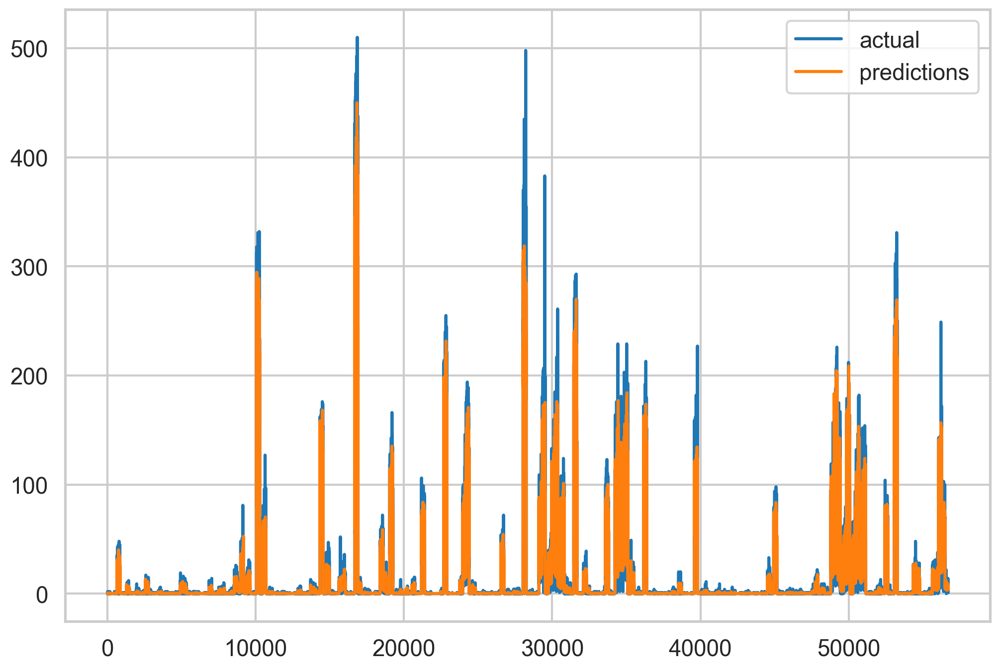

In [17]:
# visualize predictions
import matplotlib.pyplot as plt
import seaborn as sns
# retina display
%config InlineBackend.figure_format = 'retina'

sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure(figsize=(12, 8))
plt.plot(y_test, label='actual')
plt.plot(predictions, label='predictions')
plt.legend()
plt.show()

In [18]:
# visualize the predictions using plotly
import plotly.express as px
import plotly.graph_objects as go

# retina display
%config InlineBackend.figure_format = 'retina'

fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test.index, y=y_test, name='actual'))
fig.add_trace(go.Scatter(x=y_test.index, y=predictions, name='predicted'))
fig.update_layout(
    title='Baseline Model - Last 4 Weeks',
    xaxis_title='time',
    yaxis_title='rides'
)
fig.show()

Feature Importance observation for 8 weeks of data:
From the code above, it seems that the most important features are for the last 7(168h) and 21(504h) days of data.

## Summary
The results above show that if we use 8 weeks of data, we model quality is worse than if we use 4 weeks of data. This is because the model is underfitted in the training data (see the difference between the size of train vs test datasets). We can try to improve the model by using more data in the trainig set.